In [1]:
# data manipulation:
import pandas as pd
import numpy as np

# stats:
import statsmodels.api as sm
import statsmodels.formula.api as smf

# plotting and images:
import plotly.express as px
from IPython.display import Image, HTML, display

---
# About this dataset:

This file contains data from state of Florida's recount of the Presidential election for the year 2000. The two columns represent the count of the votes per county for the 1996 presidential candidate for the Reform Party (Ross Perot) and for the 2000 candidate for the reform part Pat Buchanan.

As the story goes, 1,784 votes separated Bush from Gore for the win in the state of Florida, which would have given either candidate more than the 270 electoral votes needed to secure the election. Due to the close-call nature of this result, many legal challenges ensued calling for recounts of all the votes.

In particular, there was the issue of the "overvotes" (people who appeared to have voted for more than one candidate) and the "undervotes" (people from whose votes could not be determined if they picked any candidate).

USA Today carried out an analysis that concluded that even if all overvotes and undervotes had been recounted, Bush would have still won legally. However, they also concluded that most people intended to vote for Gore, but did not...

In this notebook, we study the results of the votes for the county of Palm Beach, in particular. Because of the large elderly population, a special "butterly" ballot was used that would have made it easier for older people to see. However, the hypothesis is that said ballot was so confusing that people who would have otherwise voted for Gore, ended up voting for Pat Buchanan.

In order to test the hypothesis, Kosuke Imai ("Quantitative Social Science: An Introduction") tried to predict the number of votes for Buchanan (Reform Party) in Palm Beach County using the 1996 vote count for Perot (also for the Reform Party).

As the analysis will show, it is highly likely that "Butterly" ballot had much to do with swaying the result of the elections.

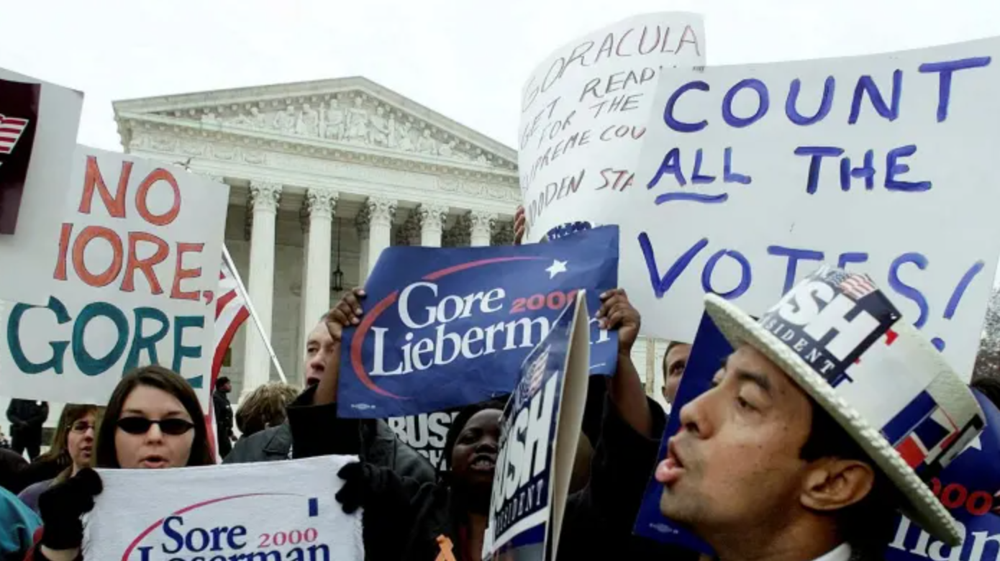

In [2]:
Image(filename='./images/fl_2000_recount.png', width=800)

#### Presidential candidates for the reform party:

In [3]:
display(HTML("<table><tr><td><img src='images/perot.png', width=400></td><td><img src='images/buchanan.png', width=459></td></tr></table>"))

,


---

## Load Florida County Votes dataset (include Palm Beach):

In [4]:
# read excel:
palm_beach = pd.read_excel('PalmBeachRegression.xlsx')

# include only first 3 columns:
palm_beach = palm_beach.iloc[:,:3]

# rename columns:
palm_beach.rename(columns={'Perot96': 'Perot-1996', 'Buchanan00':'Buchanan-2000'}, inplace=True)
palm_beach.head(5)

,county,Perot-1996,Buchanan-2000
0,Alachua,8072,263
1,Baker,667,73
2,Bay,5922,248
3,Bradford,819,65
4,Brevard,25249,570


## Plot county votes for Buchanan (2000):

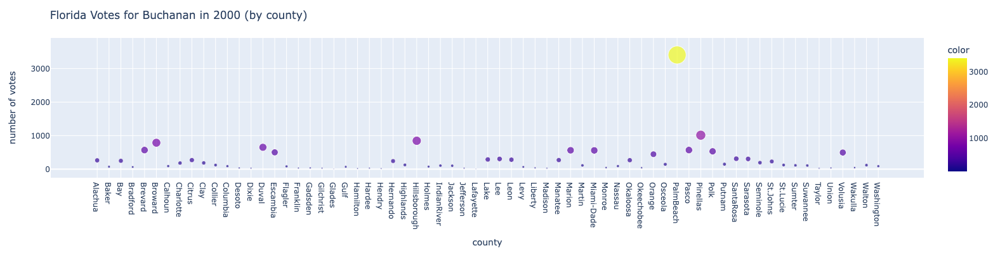

In [5]:
county_votes_fig = px.scatter(palm_beach, x="county", y="Buchanan-2000", size=palm_beach["Buchanan-2000"].values,
                             color=palm_beach["Buchanan-2000"].values)

county_votes_fig.update_layout(
                    title="Florida Votes for Buchanan in 2000 (by county)",
                    xaxis_title="county",
                    yaxis_title="number of votes ",
                    legend_title="candidate",
                    width=1400,
                    height=400,
                    )

# for static display in the repo:
# comment out when running the notebook locally
Image(filename='./images/scatter_counties.png', width=1400)

# show:
county_votes_fig

Above we can clearly see the how big of an outlier "Palm Beach" is in terms of the number of Votes for Buchanan. Next, we'll fit a line to the points by using the votes for Perot in 1996 as a predictor for the 2000 election votes for Buchanan. 

---
## Line of Best Fit: exploring the options


#### Statsmodel OLS equation:
One alternative is to set an equation with python's "StatsModels", with Buchanan-2000 as the dependent variable, and Perot-1996 as the independent variable. Here you define what the variables and their interactions are and fit a model accordingly, as opposed to providing the dependent and independent variable in the Plotly implementation and getting a model out by calling OLS.

i.e. Buchanan-2000 (votes) = intercept + x1 * Perot-1996(votes)

In [6]:
sm_eq = smf.ols(formula='Q("Buchanan-2000") ~ Q("Perot-1996")', data=palm_beach)
sm_model = sm_eq.fit()

#### Statsmodel OLS equation results:

In [7]:
# model summary:
print(sm_model.summary2())

                   Results: Ordinary least squares
Model:              OLS                Adj. R-squared:     0.506     
Dependent Variable: Q("Buchanan-2000") AIC:                963.5363  
Date:               2022-03-21 17:12   BIC:                967.9457  
No. Observations:   67                 Log-Likelihood:     -479.77   
Df Model:           1                  F-statistic:        68.48     
Df Residuals:       65                 Prob (F-statistic): 9.47e-12  
R-squared:          0.513              Scale:              1.0009e+05
----------------------------------------------------------------------
                  Coef.   Std.Err.    t     P>|t|    [0.025    0.975] 
----------------------------------------------------------------------
Intercept         1.3458   49.7593  0.0270  0.9785  -98.0304  100.7219
Q("Perot-1996")   0.0359    0.0043  8.2752  0.0000    0.0272    0.0446
---------------------------------------------------------------------
Omnibus:               121.011    

---
### Plotly Scatter with OLS Trendline:
By far the easiest way to implement a line of best fit is employ Plotly's 'trendline' argument to the scatterplot. Here, "ols" corresponds to 'ordinary least squares'.
This kills two birds with one stone: plots the regression line along with the data and returns a fitted model.

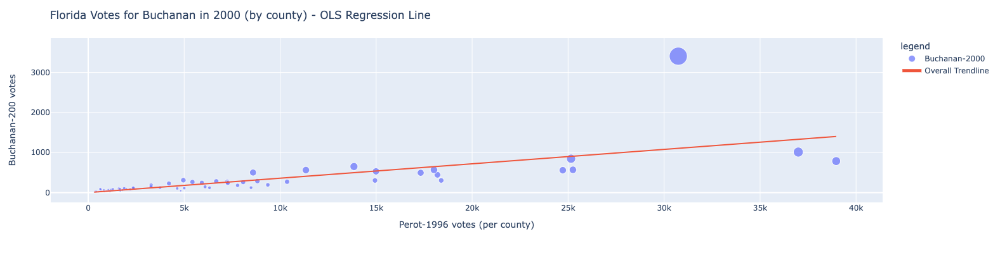

In [8]:
# plot regression line along with the data:
regression_fig = px.scatter(palm_beach, x="Perot-1996", y=["Buchanan-2000"], size=palm_beach["Buchanan-2000"].values, trendline="ols", trendline_scope="overall")

# get equation - explicitly:
model = px.get_trendline_results(regression_fig)
alpha = model.iloc[0]["px_fit_results"].params[0]
beta = model.iloc[0]["px_fit_results"].params[1]
eq = regression_fig.data[1].name  + ' votes = ' + str(round(alpha, 2)) + ' + ' + str(round(beta, 2)) + ' * Perot-1996'

# plot options:
regression_fig.update_layout(
                    title="Florida Votes for Buchanan in 2000 (by county) - OLS Regression Line",
                    xaxis_title="Perot-1996 votes (per county)",
                    yaxis_title="Buchanan-200 votes ",
                    legend_title="legend",
                    width=1400,
                    height=400,
                    )

# for static display in the repo:
Image(filename='./images/ols_fit_scatter.png', width=1400)

# show:
regression_fig

Above we can see the result of fitting a line to the 2000 Buchanan votes by using the 1996 Perot votes as a predictor. Because the line must account for the big outlier present in the "Palm Beach" county votes, we expect to see bias in terms of the slope of the line as we move towards higher numbers Specifically, to the right of Palm Beach. Later, we plot the residuals and see how they fair in this region.

#### Plotly OLS Trendline results:
Below we pull the model parameters and check for goodness of fit and statistical significance of the predictors.

In [9]:
results = px.get_trendline_results(regression_fig)
results.iloc[0]["px_fit_results"].summary(yname='Buchanan-2000', xname=['constant', 'Perot-1996'], alpha=0.05, slim=True)
# results.query("variable == 'Buchanan00'").px_fit_results.iloc[0].summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          Buchanan-2000   R-squared:                       0.513
Model:                            OLS   Adj. R-squared:                  0.506
No. Observations:                  67   F-statistic:                     68.48
Covariance Type:            nonrobust   Prob (F-statistic):           9.47e-12
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
constant       1.3458     49.759      0.027      0.979     -98.030     100.722
Perot-1996     0.0359      0.004      8.275      0.000       0.027       0.045
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.48e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""



Above, we can see that the output of the model is giving us a fairly low R-squared value at 0.513. However, the predictor (Perot-1996) is statitically significant with a p-value < 0.0001.

Later on, we will revisit these numbers when we remove "Palm Beach" (the outlier) from the dataset and rerun the analysis.

#### Best fit equation:

In [10]:
eq

'Overall Trendline votes = 1.35 + 0.04 * Perot-1996'

---
## Plotting the residuals:
Below we plot the residuals of the fit to check for issues such as Heteroskedasticity, outlier influence, etc..

First, we plot the raw residuals and show how they point out to issues in our fit. Then we plot the "Studentized" residuals which will give us a better sense for the presence and influence of outliers.

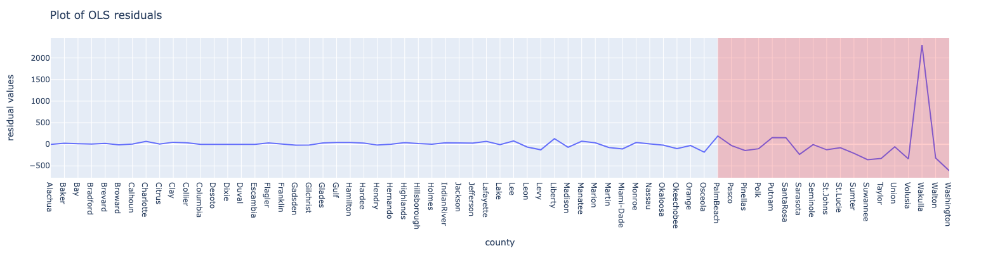

In [11]:
# get model results object:
results = px.get_trendline_results(regression_fig)

# pull out the residuals:
resid = results.iloc[0]["px_fit_results"].resid
fig_res = px.line(palm_beach, x="county", y=resid)

# add red area:
fig_res.add_vrect(x0='PalmBeach', x1='Washington', line_width=0, fillcolor="red", opacity=0.2)

# plot options:
fig_res.update_layout(
                    title="Plot of OLS residuals",
                    xaxis_title="county",
                    yaxis_title="residual values",
                    legend_title="legend",
                    width=1400,
                    height=400,
                    )

# for static display in the repo:
Image(filename='./images/ols_residuals_raw.png', width=1400)

# show:
fig_res

As the residual plot above shows, the line of best fit does a poor job at accurately predicting the votes for the counties ranging from "Palm Beach" all the way to "Washington". As we have discussed previouly, the reason for this is the presence of higher than normal vote counts for "Palm Beach". This area is shaded red.

When residuals "fan-out" like this, it is a tell-tale sign of the presence of non-constant variance, a.k.a. Heteroskedasctity. This is introduced into the dataset as a consequence of the difference in the range of values for the population votes of each county. 

In this case specifically, "Palm Beach" sits with 3,407 votes (max) versus "Hendry" county with 22 votes(minimum). A difference of approximately 154x!

According to Jim Frost ("Regression Analysis", Statistics By Jim Publishing, 2019, page 210) the preferred method of dealing with this issue is to reduce the impact of the scale differential by redefining the variables. Ideally, we'd begin by scaling the county vote counts to a per-capita rate. 

However, we are not given the size of the population for each county on this dataset. We'll leave things as they stand since we'll be dealing with this issue later by removing "Palm Beach" from the dataset. 

We just wanted to bring attention to this problem and show how residuals can help us spot issues with our models.

---
## Outlier Influence:
Below we plot the "Studentized" residuals, which are a better measure of the presence of outliers since they are computed by taking the raw residual values and dividing by the standard deviation of the residuals. The results tell you how many standard deviations away the observed value(s) fall from the fitted values.

Source: Jim Frost ("Regression Analysis", Statistics By Jim Publishing, 2019, page 228)

#### Studentized residuals:

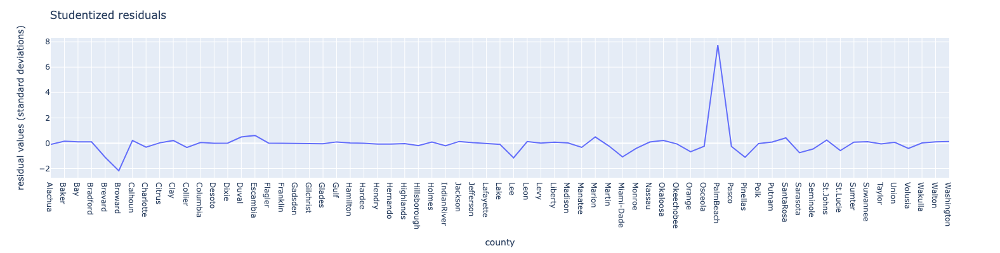

In [12]:
# get outlier influence object from statsmodels:
influence = sm_model.get_influence()

# extract the studentized residuals:
studentized_residuals = influence.resid_studentized

# plot:
studentized_fig = px.line(palm_beach, x="county", y=studentized_residuals)
# plot options:
studentized_fig.update_layout(
                    title="Studentized residuals",
                    xaxis_title="county",
                    yaxis_title="residual values (standard deviations)",
                    legend_title="legend",
                    width=1400,
                    height=400,
                    )

# for static display in the repo:
Image(filename='./images/student_res.png', width=1400)

# show:
studentized_fig

As we can clearly see above, the observed value for "Palm Beach" is almost 8 standard devations from the fitted values. Signaling it as a huge outlier.

#### Difference in Fits:
The "Difference in Fits" tell you approximately the number of standard deviations that fitted values change when an observation is removed from the dataset. Higher values represent more influence and higher leverage.

Jim Frost ("Regression Analysis", Statistics By Jim Publishing, 2019, page 233)

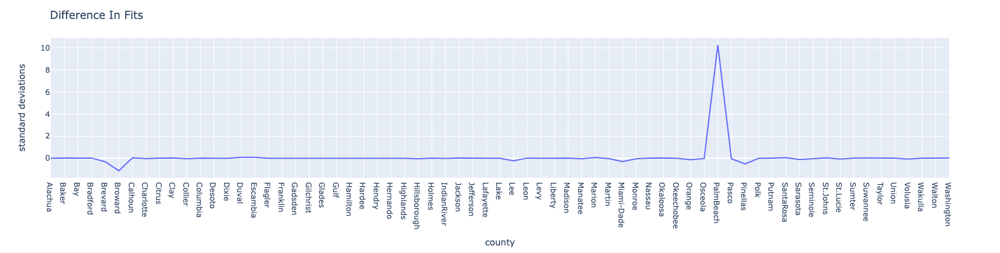

In [13]:
# extract influential values in our variables -- "Difference in Fits":
influential_values = influence.dffits

# plot:
influential_vals_fig = px.line(palm_beach, x="county", y=influential_values[0])
# plot options:
influential_vals_fig.update_layout(
                    title="Difference In Fits",
                    xaxis_title="county",
                    yaxis_title="standard deviations",
                    legend_title="legend",
                    width=1400,
                    height=400,
                    )

# for static display in the repo:
Image(filename='./images/dfits.png', width=1400)

# show:
influential_vals_fig

Again, DFITS confirms our suspicion that the vote values for "Palm Beach" are not just an otlier, but exerting a significant amoubt influence on the fitted results.

#### Cook's Distance:
The distance between the coefficients calculated with and without an observation. Higher values mean more influence.

Jim Frost ("Regression Analysis", Statistics By Jim Publishing, 2019, page 233)

In [14]:
# # extract Cooks distance from the influence object:
# cooks_distance = influence.cooks_distance

# # plot:
# cooks_distance_fig = px.line(palm_beach, x="county", y=cooks_distance[1])
# # plot options:
# cooks_distance_fig.update_layout(
#                     title="Cooks Distance",
#                     xaxis_title="county",
#                     yaxis_title="standard deviations",
#                     legend_title="legend",
#                     width=1400,
#                     height=400,
#                     )
# cooks_distance_fig

---

## What if...
Now that we have convinced ourselves that the vote count for the county of "Palm Beach" is a massive outlier and that it was rightly cause for investigation, we'll rerun the analysis with said county removed from the data and take a look at the results.

#### Remove "Palm Beach" county from the dataset:

In [15]:
no_palm_beach = palm_beach[palm_beach['county'] != "PalmBeach"]
no_palm_beach.tail(20)

,county,Perot-1996,Buchanan-2000
46,Okeechobee,1666,43
47,Orange,18191,446
48,Osceola,6091,145
50,Pasco,18011,570
51,Pinellas,36990,1013
52,Polk,14991,532
53,Putnam,3272,148
54,SantaRosa,4957,311
55,Sarasota,14939,305
56,Seminole,9357,194


#### Refit a line:

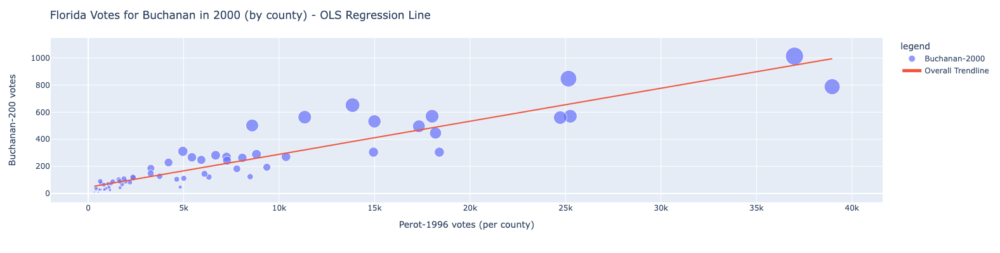

In [16]:
# plot regression line along with the data:
npb_regression_fig = px.scatter(no_palm_beach, x="Perot-1996", y=["Buchanan-2000"], size=no_palm_beach["Buchanan-2000"].values, trendline="ols", trendline_scope="overall")

# plot options:
npb_regression_fig.update_layout(
                    title="Florida Votes for Buchanan in 2000 (by county) - OLS Regression Line",
                    xaxis_title="Perot-1996 votes (per county)",
                    yaxis_title="Buchanan-200 votes ",
                    legend_title="legend",
                    width=1400,
                    height=400,
                    )

# for static display in the repo:
Image(filename='./images/new_scatter_fig.png', width=1400)

# show:
npb_regression_fig

#### Get model results:

In [17]:
npb_results = px.get_trendline_results(npb_regression_fig)
npb_results.iloc[0]["px_fit_results"].summary(yname='Buchanan-2000', xname=['constant', 'Perot-1996'], alpha=0.05, slim=True)

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          Buchanan-2000   R-squared:                       0.851
Model:                            OLS   Adj. R-squared:                  0.849
No. Observations:                  66   F-statistic:                     366.0
Covariance Type:            nonrobust   Prob (F-statistic):           3.61e-28
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
constant      45.8419     13.893      3.300      0.002      18.088      73.596
Perot-1996     0.0244      0.001     19.131      0.000       0.022       0.027
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.4e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

As we can already see above, the R-squared for the model went from 0.513 to 0.851. Also, both the constant and the coefficient for the Perot-1996 variable are below the alpha value of 0.05; the threshold for statistical significance.

#### Check residuals

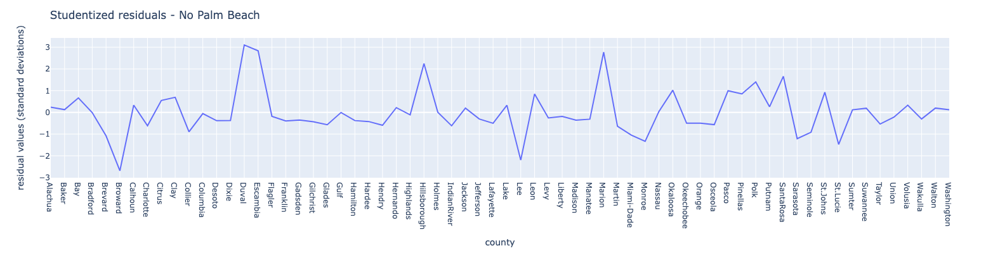

In [18]:
npb_sm_eq = smf.ols(formula='Q("Buchanan-2000") ~ Q("Perot-1996")', data=no_palm_beach)
npb_sm_model = npb_sm_eq.fit()

# get outlier influence object from statsmodels:
npb_influence = npb_sm_model.get_influence()

# extract the studentized residuals:
npb_studentized_residuals = npb_influence.resid_studentized

# plot:
npb_studentized_fig = px.line(no_palm_beach, x="county", y=npb_studentized_residuals)
# plot options:
npb_studentized_fig.update_layout(
                    title="Studentized residuals - No Palm Beach",
                    xaxis_title="county",
                    yaxis_title="residual values (standard deviations)",
                    legend_title="legend",
                    width=1400,
                    height=400,
                    )

# for static display in the repo:
Image(filename='./images/new_student_res.png', width=1400)

# show:
npb_studentized_fig

As we can see above, the new studentized residuals corresponding to the dataset without "Palm Beach" county show a random pattern, which is desirable.

---

## What should have been the correct count of votes for Buchanan in Palm Beach in the 2000 election?

In [19]:
# get the count of votes for Perot in 1996:
perot_1996_vote_count = palm_beach[palm_beach['county'] == 'PalmBeach']['Perot-1996']
f"The number of votes for Perot in 1990 was: {int(perot_1996_vote_count)}"

'The number of votes for Perot in 1990 was: 30739'

In [20]:
# use Perot's 1996 vote count to predict Buchanan's
prediction = npb_sm_model.predict(perot_1996_vote_count)
f"The number of votes for Buchanan in 2000 should have been: {int(prediction)}"

'The number of votes for Buchanan in 2000 should have been: 794'

In [21]:
# difference between actual and predicted:
actual_votes = palm_beach[palm_beach['county'] == 'PalmBeach']['Buchanan-2000']
difference = int(actual_votes - prediction)
difference_percent = ((actual_votes - prediction) / prediction)*100
f"The percent difference between the actual votes and predicted votes for Buchanan in the 2000 presidential election was: {float(round(difference_percent, 2))} percent, or {difference} votes."

'The percent difference between the actual votes and predicted votes for Buchanan in the 2000 presidential election was: 328.88 percent, or 2612 votes.'

---

## What happened?

As we have seen, with a presidential election hanging on a margin of less than 2,000 votes, an error of 2,612 votes for Palm Beach county alone would have been enough to swing the vote to Gore (as USA Today's analysis holds).

The reason for this is presumed to be the poor design of the "Butterfly" ballot. As we can see in the image below, a lot of people reported confusion in determing the correct hole to punch for Gore. Presumably, people punched the hole next to the #4 arrow, thinking they were voting for Gore, when in fact they were selecting Buchanan. 

As the preceding analysis showed, such a large (statistically significant) discrepancy in the number of votes could have only the result of some error.

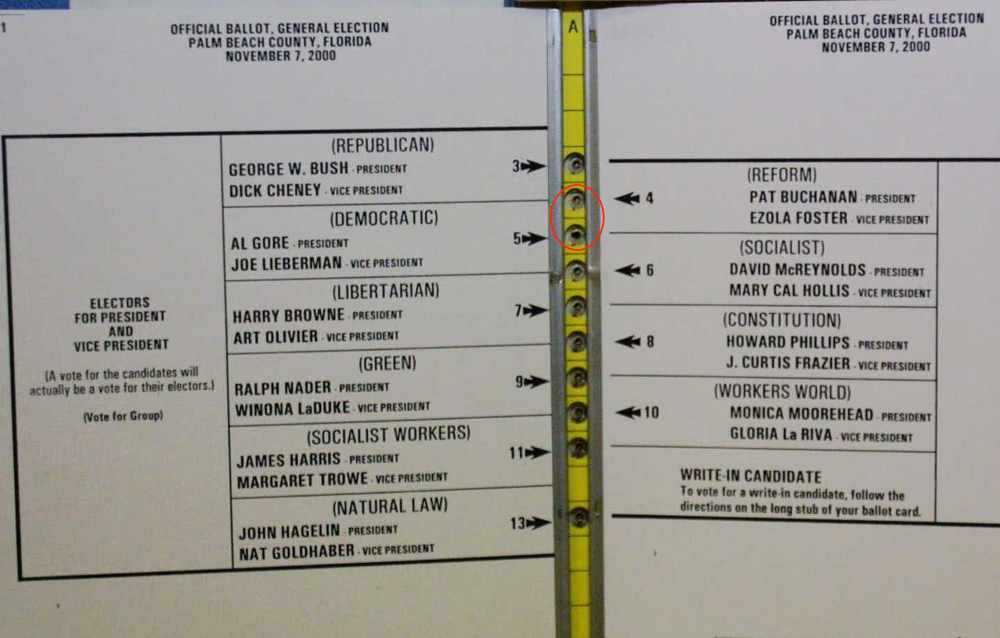

In [22]:
Image(filename='./images/butterfly.png', width=1400)